Dana Rozenblum & Efrat Magidov
# Transfer Learning for Computer Vision Tutorial
**Extended from [code](https://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html) by [Sasank Chilamkurthy](https://chsasank.github.io).**  
License: BSD.

In this tutorial, you will learn how to train a convolutional neural network for
image classification using transfer learning. You can read more about the transfer
learning at the [CS231N notes](https://cs231n.github.io/transfer-learning/).

Quoting these notes:

    In practice, very few people train an entire Convolutional Network
    from scratch (with random initialization), because it is relatively
    rare to have a dataset of sufficient size. Instead, it is common to
    pretrain a ConvNet on a very large dataset (e.g. ImageNet, which
    contains 1.2 million images with 1000 categories), and then use the
    ConvNet either as an initialization or a fixed feature extractor for
    the task of interest.

These two major transfer learning scenarios look as follows:

-  **Finetuning the convnet**: Instead of random initializaion, we
   initialize the network with a pretrained network, like the one that is
   trained on imagenet 1000 dataset. Rest of the training looks as
   usual.
-  **ConvNet as fixed feature extractor**: Here, we will freeze the weights
   for all of the network except that of the final fully connected
   layer. This last fully connected layer is replaced with a new one
   with random weights and only this layer is trained.




### Running notes
If you are running this in Google Colab, be sure to change the runtime to GPU by clicking `Runtime > Change runtime type` and selecting "GPU" from the dropdown menu.

### Import relevant packages

In [1]:
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [3]:
from __future__ import print_function, division

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy

plt.ion()   # interactive mode

## Load Data

We will use `torchvision` and `torch.utils.data` packages for loading the
data.

The problem we're going to solve today is to train a model to classify
present and future **Israeli politicians**. We have about ~100 training images for each of our 9 politicians, scraped from the first page of the Google Images Search.
Usually, this is a very small dataset to generalize upon, if trained from scratch (or is it? We'll soon test this ourselves!). Since we are using transfer learning, we should be able to generalize reasonably well.

In [4]:
# Create a folder for our data
!mkdir data
!mkdir data/israeli_politicians

In [5]:
# Download our dataset and extract it
import requests
from zipfile import ZipFile

url = 'https://github.com/omriallouche/ydata_deep_learning_2021/blob/main/data/israeli_politicians.zip?raw=true'
r = requests.get(url, allow_redirects=True)
open('./data/israeli_politicians.zip', 'wb').write(r.content)

with ZipFile('./data/israeli_politicians.zip', 'r') as zipObj:
   # Extract all the contents of zip file in current directory
   zipObj.extractall(path='./data/israeli_politicians/')

In [6]:
# On Linux machines, the following simpler code can be used instead
# !wget https://github.com/omriallouche/ydata_deep_learning_2021/blob/main/data/israeli_politicians.zip?raw=true
# !unzip israeli_politicians.zip -d data/israeli_politicians/

### Datasets definition
PyTorch uses DataLoaders to define datasets. We'll create 2 data loaders, `train` and `val` (for validation).  
Our dataset was already split into different folders for these - as you can see under the "Files" menu on the left of the Colab.

In [7]:
means = [0.485, 0.456, 0.406]
stds = [0.229, 0.224, 0.225]

data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
    'val': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
}

In [8]:
data_dir = r'./data/israeli_politicians/'

image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
dataloaders = {
    'train': torch.utils.data.DataLoader(image_datasets['train'], batch_size=16,
                                             shuffle=True, num_workers=4),
    'val': torch.utils.data.DataLoader(image_datasets['val'], batch_size=16,
                                          shuffle=False, num_workers=4)
  }
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
print('dataset_sizes: ', dataset_sizes)

class_names = image_datasets['train'].classes
print('class_names:', class_names)

dataset_sizes:  {'train': 929, 'val': 234}
class_names: ['ayelet_shaked', 'benjamin_netanyahu', 'benny_gantz', 'danny_danon', 'gideon_saar', 'kostya_kilimnik', 'naftali_bennett', 'ofir_akunis', 'yair_lapid']


In [9]:
# Check for the availability of a GPU, and use CPU otherwise
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

### Datasets and Dataloaders
Let's examine the dataloaders and datasets and learn more about their attributes and functions.  

In [10]:
train_dataloader = dataloaders['train']

In Colab or Jupyter notebook, if we type  `train_dataloader.` and wait, we'd see a drop-down with the object attributes and functions.  

`train_dataloader.dataset.samples` contains the filenames + true labels (0 to 8 for our 9 classes).  
`train_dataloader.dataset.classes` contains the class names in order.  
`train_dataloader.dataset.class_to_idx` contains a map from a class name to the integer that represents it.

In [11]:
train_dataloader.dataset.class_to_idx

{'ayelet_shaked': 0,
 'benjamin_netanyahu': 1,
 'benny_gantz': 2,
 'danny_danon': 3,
 'gideon_saar': 4,
 'kostya_kilimnik': 5,
 'naftali_bennett': 6,
 'ofir_akunis': 7,
 'yair_lapid': 8}

### Visualize a few images

Let's visualize a few training images so as to understand the data
augmentations.



In [12]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array(means)
    std = np.array(stds)
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    fig = plt.figure(figsize=(5,3), dpi=300)
    plt.imshow(inp)
    if title is not None:
       plt.title(title, fontsize=5)
    plt.pause(0.001)  # pause a bit so that plots are updated

In [13]:
# Get a batch of training data - the data loader is a generator
inputs, classes = next(iter(dataloaders['train']))

`inputs` is a tensor of shape `[16, 3, 256, 256]` - there are 16 images in the batch, each with 3 color channels (RGB), a width of 256 pixels, and a height of 256 pixels:

In [14]:
inputs.shape

torch.Size([16, 3, 256, 256])

In [15]:
inputs

tensor([[[[ 1.8379,  1.8550,  1.8722,  ..., -2.1179, -2.1179, -2.1179],
          [ 1.8550,  1.8722,  1.8893,  ..., -2.1179, -2.1179, -2.1179],
          [ 1.8722,  1.8893,  1.9064,  ..., -2.1179, -2.1179, -2.1179],
          ...,
          [ 0.2796,  0.2796,  0.2796,  ..., -2.1179, -2.1179, -1.7925],
          [ 0.2967,  0.2796,  0.2796,  ..., -2.1179, -2.1179, -1.8610],
          [ 0.2967,  0.2967,  0.2967,  ..., -2.1179, -2.1179, -1.8953]],

         [[ 2.1310,  2.1485,  2.1660,  ..., -1.0553, -1.0903, -1.1253],
          [ 2.1485,  2.1660,  2.1835,  ..., -1.0378, -1.0903, -1.1078],
          [ 2.1660,  2.1835,  2.2010,  ..., -1.0378, -1.0728, -1.1078],
          ...,
          [ 0.4503,  0.4503,  0.4503,  ..., -1.9482, -1.6856, -1.2129],
          [ 0.4678,  0.4503,  0.4503,  ..., -1.9832, -1.7206, -1.2479],
          [ 0.4678,  0.4678,  0.4678,  ..., -1.9657, -1.7381, -1.2829]],

         [[ 2.4483,  2.4657,  2.4831,  ...,  2.5180,  2.4831,  2.4483],
          [ 2.4657,  2.4831,  

`classes` is a tensor of size 16, containing numbers matching the true class of each image, from our 9 classes.

In [16]:
classes

tensor([2, 1, 8, 3, 1, 7, 4, 1, 2, 1, 0, 7, 7, 0, 0, 1])

To map it to the class names, we can run:

In [17]:
[class_names[c] for c in classes]

['benny_gantz',
 'benjamin_netanyahu',
 'yair_lapid',
 'danny_danon',
 'benjamin_netanyahu',
 'ofir_akunis',
 'gideon_saar',
 'benjamin_netanyahu',
 'benny_gantz',
 'benjamin_netanyahu',
 'ayelet_shaked',
 'ofir_akunis',
 'ofir_akunis',
 'ayelet_shaked',
 'ayelet_shaked',
 'benjamin_netanyahu']

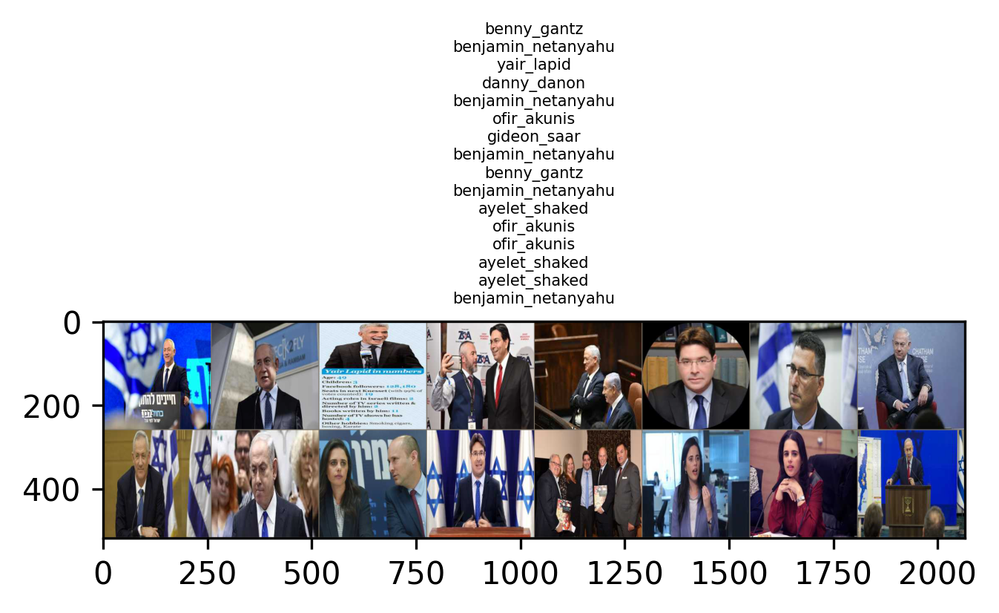

In [18]:
# Make a grid from batch
out = torchvision.utils.make_grid(inputs, nrow=8)

imshow(out, title='\n'.join([class_names[x] for x in classes]))

### Using a pretrained model
Let's load a model pretrained on ImageNet, and use it for our task.  
The first time we load the model, it will be downloaded locally, and then cached for the future.

In [19]:
# We load a pretrain model with its weights. Alternatively, one might want to only load the model architecture.
model = models.vgg16(pretrained=True)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


We can print the model to learn about its structure:

In [20]:
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

Keras has a useful model summary, that we can also use for PyTorch models:

In [21]:
!pip install torchsummary 
from torchsummary import summary
summary(model.to(device), (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
              ReLU-2         [-1, 64, 256, 256]               0
            Conv2d-3         [-1, 64, 256, 256]          36,928
              ReLU-4         [-1, 64, 256, 256]               0
         MaxPool2d-5         [-1, 64, 128, 128]               0
            Conv2d-6        [-1, 128, 128, 128]          73,856
              ReLU-7        [-1, 128, 128, 128]               0
            Conv2d-8        [-1, 128, 128, 128]         147,584
              ReLU-9        [-1, 128, 128, 128]               0
        MaxPool2d-10          [-1, 128, 64, 64]               0
           Conv2d-11          [-1, 256, 64, 64]         295,168
             ReLU-12          [-1, 256, 64, 64]               0
           Conv2d-13          [-1, 256, 64, 64]         590,080
             ReLU-14          [-1, 256,

We can see above that the final layer is a fully connected layer, from 4096 neurons to 1000 neurons, with a total of `4096 * 1000 + 1000 = 4,097,000` parameters. We add 1000 weights for the bias term of each output neuron.  

So in total, VGG-16 has 138M parameters, and we've set them all to be trainable.

However, VGG-16 and other networks created for ImageNet all have 1,000 neurons in their output, since they classify images to one of the 1,000 categories in the ImageNet challenge.  
To use the network for our task, we need to replace the final fully-connected layer with one mapping to 9 neurons instead of 1000:

In [22]:
# This code should output the number of input neurons to the final layer. We'll use it to create a new layer instead of it.
last_layer = list(model.children())[-1]
if hasattr(last_layer, 'in_features'):
  num_ftrs = last_layer.in_features
else:
  num_ftrs = last_layer[-1].in_features

num_ftrs

4096

To access and set a layer in the network, we reference it by name. In the example above, the final layer is `model.classifier[6]`.

In [23]:
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model.classifier[6]

Linear(in_features=4096, out_features=1000, bias=True)

Let's now replace it with a linear layer with 4096 input features and 9 output features:

In [24]:
model.classifier[6] = nn.Linear(in_features=4096, out_features=9)

Let's review our change in the model:

In [25]:
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [26]:
summary(model.to(device), (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
              ReLU-2         [-1, 64, 256, 256]               0
            Conv2d-3         [-1, 64, 256, 256]          36,928
              ReLU-4         [-1, 64, 256, 256]               0
         MaxPool2d-5         [-1, 64, 128, 128]               0
            Conv2d-6        [-1, 128, 128, 128]          73,856
              ReLU-7        [-1, 128, 128, 128]               0
            Conv2d-8        [-1, 128, 128, 128]         147,584
              ReLU-9        [-1, 128, 128, 128]               0
        MaxPool2d-10          [-1, 128, 64, 64]               0
           Conv2d-11          [-1, 256, 64, 64]         295,168
             ReLU-12          [-1, 256, 64, 64]               0
           Conv2d-13          [-1, 256, 64, 64]         590,080
             ReLU-14          [-1, 256,

Next, we define the loss, optimizer and LR scheduler.

In [27]:
# If a GPU is available, make the model use it
model = model.to(device)

# For a multi-class problem, you'd usually prefer CrossEntropyLoss()
criterion = nn.CrossEntropyLoss()

# Use Stochastic Gradient Descent as the optimizer, with a learning rate of 0.001 and momentum
optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

num_epochs = 10

Training the model
------------------

Now, let's write a general function to train a model. Here, we will
illustrate:

-  Scheduling the learning rate
-  Saving the best model

In the following, parameter ``scheduler`` is an LR scheduler object from
``torch.optim.lr_scheduler``.



In [28]:
def train_model(model, dataloaders, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    # Init variables that will save info about the best model
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                # Set model to training mode. 
                model.train()  
            else:
                # Set model to evaluate mode. In evaluate mode, we don't perform backprop and don't need to keep the gradients
                model.eval()   

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data
            for inputs, labels in dataloaders[phase]:
                # Prepare the inputs for GPU/CPU
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # ===== forward pass ======
                with torch.set_grad_enabled(phase=='train'):
                    # If we're in train mode, we'll track the gradients to allow back-propagation
                    outputs = model(inputs) # apply the model to the inputs. The output is the softmax probability of each class
                    _, preds = torch.max(outputs, 1) # 
                    loss = criterion(outputs, labels)

                    # ==== backward pass + optimizer step ====
                    # This runs only in the training phase
                    if phase == 'train':
                        loss.backward() # Perform a step in the opposite direction of the gradient
                        optimizer.step() # Adapt the optimizer

                # Collect statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                
            if phase == 'train':
                # Adjust the learning rate based on the scheduler
                scheduler.step()  

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            # Keep the results of the best model so far
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                # deepcopy the model
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {(time_elapsed // 60):.0f}m {(time_elapsed % 60):.0f}s')
    print(f'Best val Acc: {best_acc:4f}')

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

## Finetuning the network




### Train and evaluate
It should take around 15-25 min on CPU. On GPU though, it takes less than a minute.

In [29]:
model = train_model(model, 
                    dataloaders,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)

Epoch 0/9
----------
train Loss: 1.7741 Acc: 0.3509
val Loss: 1.4532 Acc: 0.5214

Epoch 1/9
----------
train Loss: 1.0274 Acc: 0.6523
val Loss: 0.9585 Acc: 0.6838

Epoch 2/9
----------
train Loss: 0.5846 Acc: 0.8062
val Loss: 0.7937 Acc: 0.7393

Epoch 3/9
----------
train Loss: 0.2960 Acc: 0.9053
val Loss: 0.6529 Acc: 0.7863

Epoch 4/9
----------
train Loss: 0.3107 Acc: 0.8999
val Loss: 0.7642 Acc: 0.7607

Epoch 5/9
----------
train Loss: 0.1728 Acc: 0.9451
val Loss: 0.8185 Acc: 0.7778

Epoch 6/9
----------
train Loss: 0.0687 Acc: 0.9817
val Loss: 0.7725 Acc: 0.8034

Epoch 7/9
----------
train Loss: 0.0289 Acc: 0.9935
val Loss: 0.7201 Acc: 0.8248

Epoch 8/9
----------
train Loss: 0.0236 Acc: 0.9957
val Loss: 0.7042 Acc: 0.8248

Epoch 9/9
----------
train Loss: 0.0167 Acc: 0.9957
val Loss: 0.7259 Acc: 0.8205

Training complete in 3m 16s
Best val Acc: 0.824786


### Visualizing the model predictions

Let's define a generic function to display our model's predictions for a few images:




In [30]:
def visualize_model(model, num_images=6):    
    # Record the train/evaluate mode of the model, to restore it after we're done
    was_training = model.training
    # Set the model mode to evaluate
    model.eval()
    
    images_so_far = 0
    plt.figure(figsize=(2,1), dpi=300)

    with torch.no_grad(): # No need to collect gradients when generating predictions
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1

                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
                
        # Restore the model's train/evaluate mode
        model.train(mode=was_training)

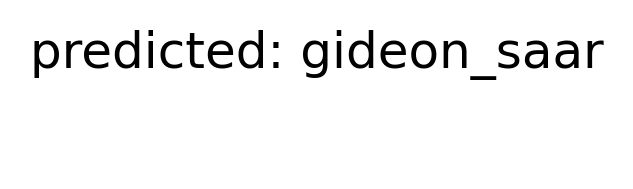

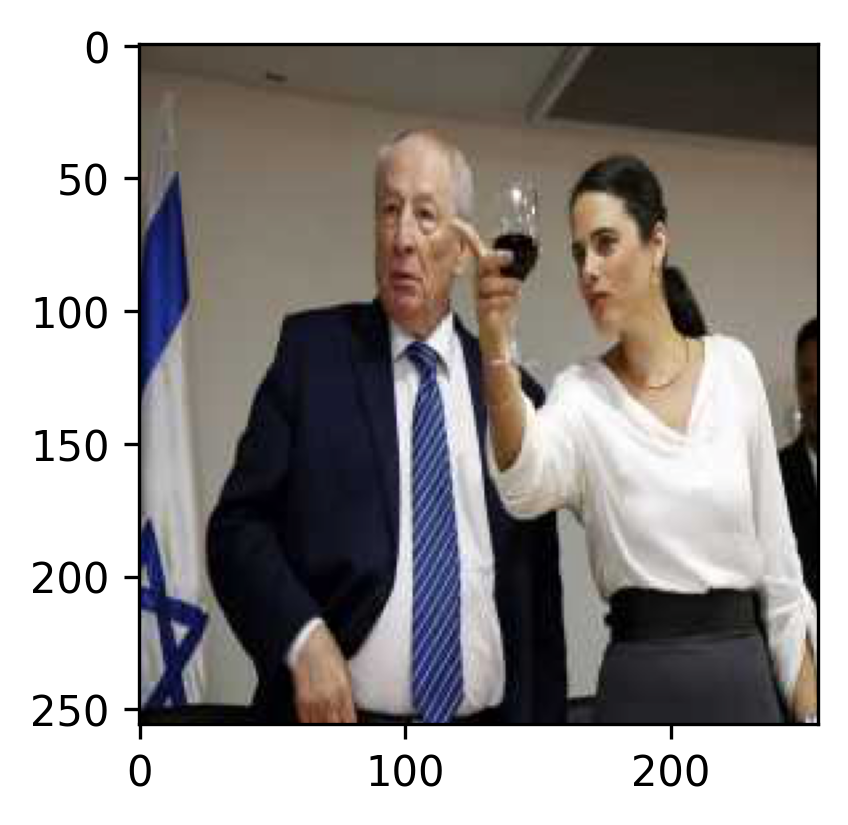

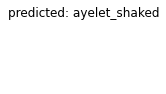

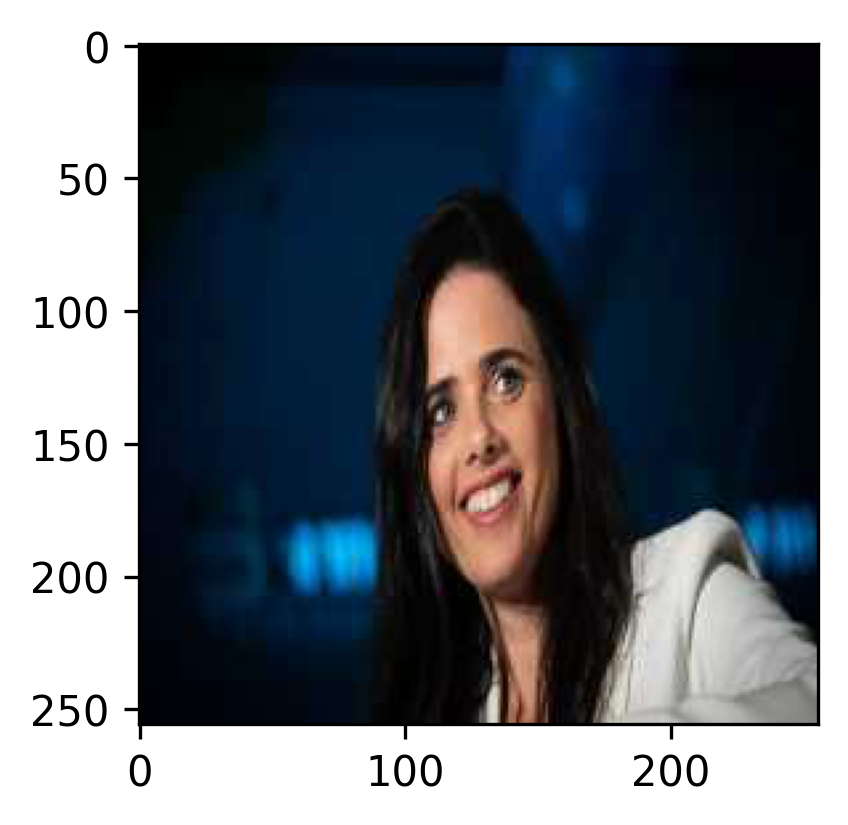

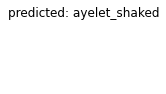

...

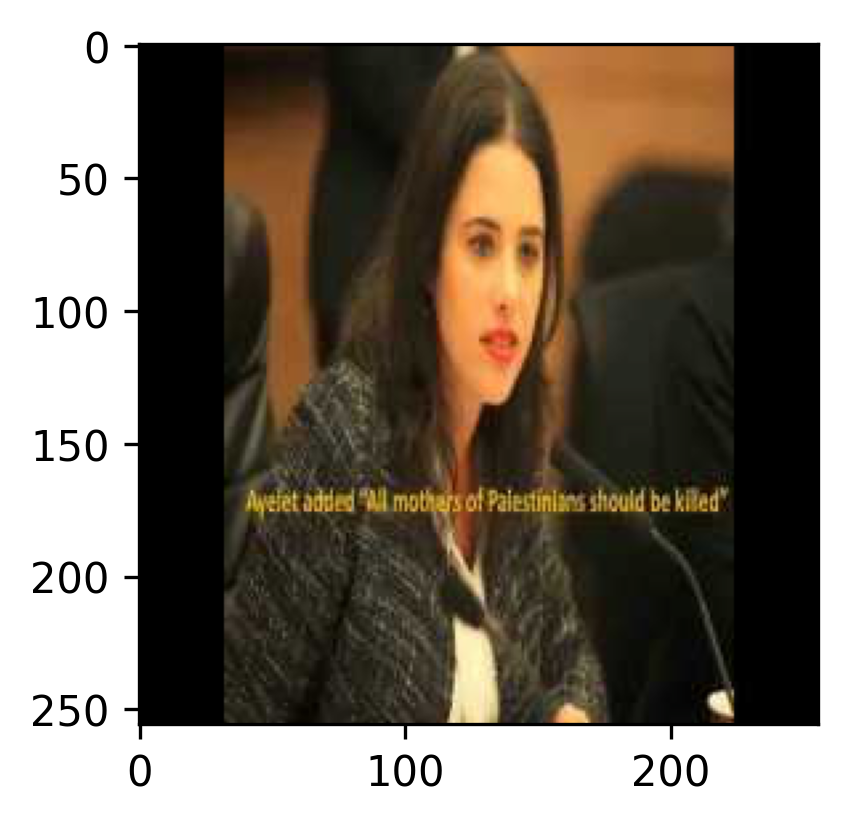

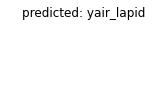

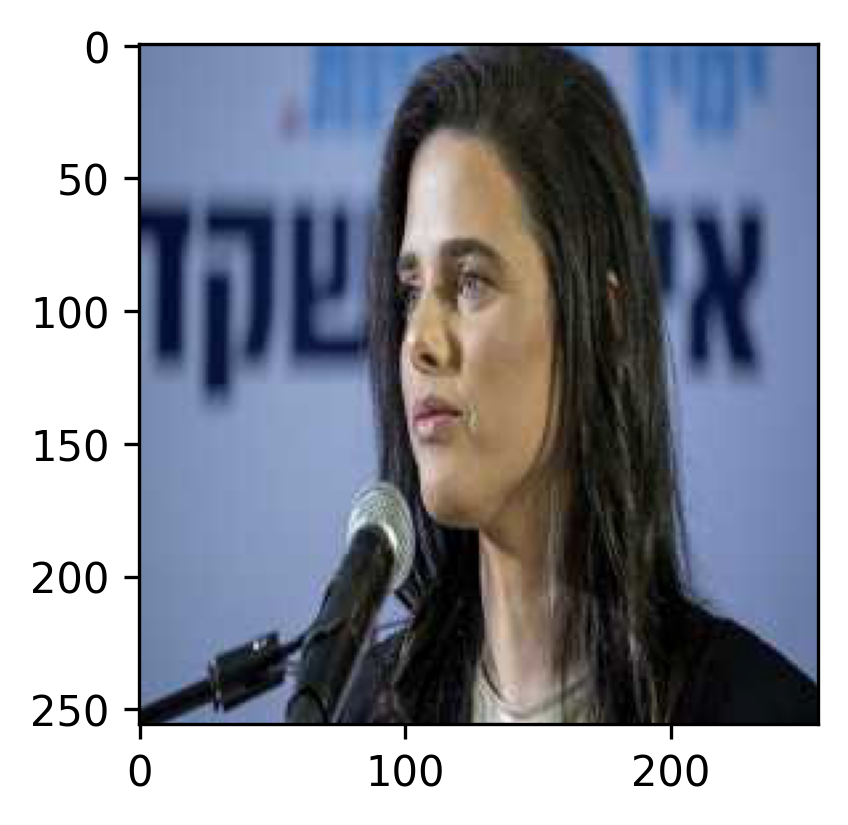

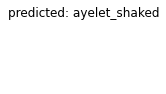

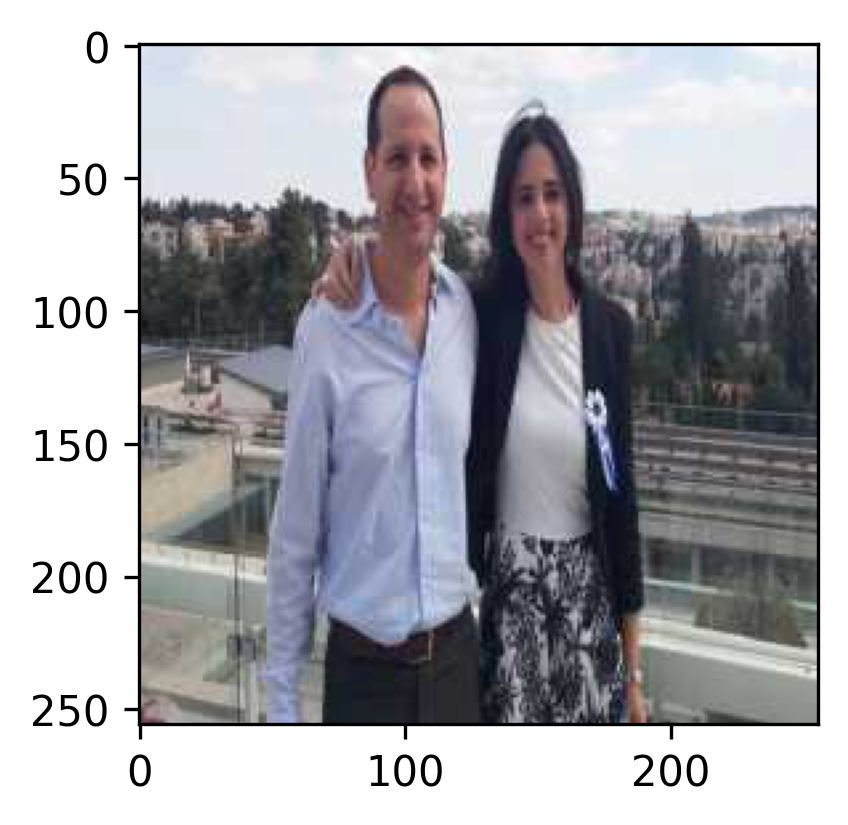

In [31]:
visualize_model(model)

# Additional Tasks
In the sections below, you'll experiment with PyTorch and NN yourself.  

Before you start having fun on your own, let's review together how to get some predictions from our trained model.  

As we've done in both our training and visualization code, we apply the model to input with the command:  
```python
outputs = model(inputs)
```

The relevant code:

In [32]:
inputs, labels = next(iter(dataloaders['train']))
inputs = inputs.to(device)
print(inputs)

labels = labels.to(device)
print(labels)

tensor([[[[-1.2103, -1.2445, -1.2959,  ...,  0.8104,  0.8104,  0.8104],
          [-1.1247, -1.1760, -1.2617,  ...,  0.8618,  0.8618,  0.8618],
          [-1.0048, -1.0733, -1.1932,  ...,  0.9474,  0.9474,  0.9474],
          ...,
          [-2.1179, -2.1179, -2.1179,  ..., -0.5082, -0.4911, -0.4739],
          [-2.1179, -2.1179, -2.1179,  ..., -0.5424, -0.5253, -0.5082],
          [-2.1179, -2.1179, -2.1179,  ..., -0.6623, -0.5938, -0.5767]],

         [[-0.6527, -0.6527, -0.6877,  ...,  1.0630,  1.0630,  1.0630],
          [-0.5651, -0.5826, -0.6527,  ...,  1.1155,  1.1155,  1.1155],
          [-0.4426, -0.4776, -0.5826,  ...,  1.2031,  1.2031,  1.2031],
          ...,
          [-1.3529, -1.3529, -1.3529,  ..., -0.4251, -0.4076, -0.3901],
          [-1.3529, -1.3529, -1.3529,  ..., -0.4601, -0.4426, -0.4251],
          [-1.3529, -1.3529, -1.3529,  ..., -0.5826, -0.5126, -0.4951]],

         [[-0.1661, -0.1835, -0.1835,  ...,  1.5594,  1.5594,  1.5594],
          [-0.0790, -0.1138, -

Note that we got tensors. We can convert them into numpy objects. Since we've previously set them to use GPU, We'll need to set them to use CPU first:

In [33]:
labels.cpu().numpy()

array([6, 7, 3, 0, 2, 3, 1, 0, 7, 7, 6, 1, 1, 8, 3, 3])

In [34]:
outputs = model(inputs)

print(outputs.shape)
print(outputs)

torch.Size([16, 9])
tensor([[-9.2409e-01,  3.4597e+00, -2.3921e+00, -1.5189e+00, -3.8522e-02,
          1.0640e+00,  1.1683e+01, -6.2863e+00, -5.2082e+00],
        [-4.3143e+00, -6.0207e+00, -7.3579e+00,  5.2145e+00,  4.2405e+00,
         -2.6983e+00, -7.8370e+00,  2.0367e+01,  1.0165e+00],
        [-7.1404e-01,  4.3945e-01, -5.7768e+00,  1.3881e+01,  1.7046e+00,
         -4.6875e+00,  4.3338e-01, -5.2429e-01, -2.4017e+00],
        [ 9.5824e+00, -4.7650e+00, -6.2564e+00,  4.6773e+00, -3.2082e+00,
         -3.5415e+00,  1.2590e+00,  2.1421e+00,  6.8190e-01],
        [-5.4912e+00,  1.0239e+00,  1.4922e+01, -3.5632e+00,  8.8829e-01,
         -4.0466e+00, -2.1761e+00, -3.6466e-03,  1.5421e-01],
        [ 1.0020e+00, -7.0843e-01, -7.0091e+00,  9.0361e+00, -7.0814e-01,
         -1.1764e+00,  1.9570e+00,  5.2876e-01, -2.4593e+00],
        [-4.3576e+00,  1.4637e+01,  4.4429e-01, -4.4071e-01, -8.2108e-01,
         -5.5629e+00,  5.6319e+00, -6.0779e+00, -2.2530e+00],
        [ 1.0525e+01, -5.039

Note that `outputs` have 16 "rows", one for each of the images in our batch, and each "row" has 9 values, for each of our classes.  
The values are the activations of the neurons, before applying the softmax function to them. To apply the softmax function to them, we can run:

In [35]:
torch.nn.functional.softmax(outputs, dim=1).cpu().detach().numpy()

array([[3.34755418e-06, 2.68288772e-04, 7.71237410e-07, 1.84670739e-06,
        8.11566133e-06, 2.44428484e-05, 9.99693155e-01, 1.57014792e-08,
        4.61471892e-08],
       [1.90994304e-11, 3.46696521e-12, 9.10320430e-13, 2.62619238e-07,
        9.91576456e-08, 9.61270924e-11, 5.63803019e-13, 9.99999642e-01,
        3.94615851e-09],
       [4.58500210e-07, 1.45308911e-06, 2.90141489e-09, 9.99990821e-01,
        5.14927569e-06, 8.62399308e-09, 1.44430498e-06, 5.54302346e-07,
        8.48047037e-08],
       [9.91689563e-01, 5.82555629e-07, 1.31108081e-07, 7.34695839e-03,
        2.76353126e-06, 1.98019893e-06, 2.40732581e-04, 5.82199951e-04,
        1.35180991e-04],
       [1.36372935e-09, 9.20939385e-07, 9.99997497e-01, 9.37725897e-09,
        8.04112972e-07, 5.78259662e-09, 3.75376281e-08, 3.29573595e-07,
        3.85930605e-07],
       [3.23743501e-04, 5.85272719e-05, 1.07397554e-07, 9.98469293e-01,
        5.85437410e-05, 3.66527565e-05, 8.41256173e-04, 2.01679766e-04,
        1.0

## Task 1: Plot model convergence
Adapt the code above to plot the loss and the accuracy every epoch. Show both the training and the validation performance.  
Does our model overfit?  
Do you have suggestions following these graphs? 

In [36]:
def train_model_with_plot(model, dataloaders, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    # Init variables that will save info about the best model
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    # Lists to save loss and the accuracy for every epoch
    train_loss = []
    train_acc = []
    val_loss = []
    val_acc = []

    for epoch in range(num_epochs):

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                # Set model to training mode. 
                model.train()  
            else:
                # Set model to evaluate mode. In evaluate mode, we don't perform backprop and don't need to keep the gradients
                model.eval()   

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data
            for inputs, labels in dataloaders[phase]:
                # Prepare the inputs for GPU/CPU
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # ===== forward pass ======
                with torch.set_grad_enabled(phase=='train'):
                    # If we're in train mode, we'll track the gradients to allow back-propagation
                    outputs = model(inputs) # apply the model to the inputs. The output is the softmax probability of each class
                    _, preds = torch.max(outputs, 1) # 
                    loss = criterion(outputs, labels)

                    # ==== backward pass + optimizer step ====
                    # This runs only in the training phase
                    
                    if phase == 'train':
                        loss.backward() # Perform a step in the opposite direction of the gradient
                        optimizer.step() # Adapt the optimizer

                # Collect statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                
            if phase == 'train':
                # Adjust the learning rate based on the scheduler
                scheduler.step()  

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            # Save epoch loss and accuract
            if phase == 'train':
                train_loss.append(epoch_loss)
                train_acc.append(epoch_acc)

            else:
                val_loss.append(epoch_loss)
                val_acc.append(epoch_acc)

            # Keep the results of the best model so far
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                # deepcopy the model
                best_model_wts = copy.deepcopy(model.state_dict())

    time_elapsed = time.time() - since
    print(f'Training complete in {(time_elapsed // 60):.0f}m {(time_elapsed % 60):.0f}s')
    print(f'Best val Acc: {best_acc:4f}')

    # plot the loss and the accuracy every epoch
    fig, (ax1,ax2) = plt.subplots(1,2, figsize=(11, 5), facecolor='w', edgecolor='k')
    ax1.set_title('Loss at each epoch')
    ax2.set_title('Accuracy at each epoch')
    ax1.plot(range(num_epochs),train_loss,label="train")
    ax1.plot(range(num_epochs),val_loss,label="validation")
    ax2.plot(range(num_epochs),train_acc,label="train")
    ax2.plot(range(num_epochs),val_acc,label="validation")
    ax1.legend()
    ax2.legend()

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model 


Training complete in 3m 22s
Best val Acc: 0.824786


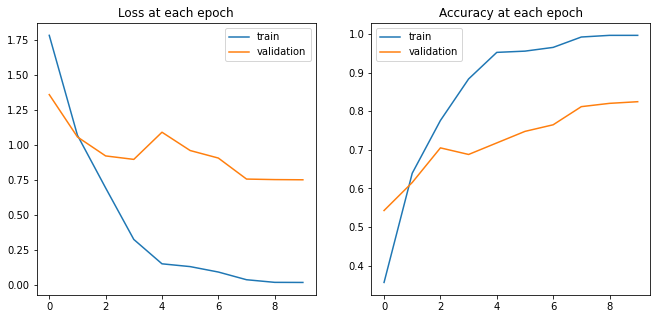

In [37]:
# Removed the message on each epoch so please wait, it is running. Thanks!

model = models.vgg16(pretrained=True)
model.classifier[6] = nn.Linear(in_features=4096, out_features=9)
model = model.to(device)
optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
model = train_model_with_plot(model, 
                    dataloaders,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)

The model overfitts (training accuracy is higher than validation accuracy, and training loss is lower than validation loss).

Since both curves show improvement over time it indicates that the training dataset is unrepresentative, i.e. it does not provide sufficient information to learn the problem, relative to the validation dataset used to evaluate it.

To solve this issue we should add more examples to the training dataset, ideally by gathering more data, but if not possible then by augmentation of the existing examples (e.g. by rotation). Anither option is to use cross-validation so that all the data has the opportunity to be represented in both the training and validation sets.

## Task 2: Evaluate the model performance
Write code that shows the performance of our model.  
Show the classification report and the confusion matrix.  

What can you say about the model so far?  
Can you suggest a few ideas to improve it?

In [38]:
def get_predictions(model, data_loader):
    model.eval()
    predictions = []
    real_values = []
  
    with torch.no_grad():
    
        for inputs, labels in data_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            predictions.extend(preds)
            real_values.extend(labels)
  
    predictions = torch.as_tensor(predictions).cpu()
    real_values = torch.as_tensor(real_values).cpu()
    return predictions, real_values

In [39]:
from sklearn.metrics import classification_report

y_pred, y_test = get_predictions(model, dataloaders['val'])
print(classification_report(y_test, y_pred, target_names=class_names))

                    precision    recall  f1-score   support

     ayelet_shaked       0.91      0.88      0.89        24
benjamin_netanyahu       0.89      0.83      0.86        58
       benny_gantz       0.71      0.55      0.62        22
       danny_danon       0.87      0.91      0.89        22
       gideon_saar       0.90      0.79      0.84        24
   kostya_kilimnik       0.50      0.67      0.57         3
   naftali_bennett       0.74      0.74      0.74        23
       ofir_akunis       0.76      0.94      0.84        34
        yair_lapid       0.81      0.92      0.86        24

          accuracy                           0.82       234
         macro avg       0.79      0.80      0.79       234
      weighted avg       0.83      0.82      0.82       234



In [40]:
import itertools

def plot_confusion_matrix(cm, classes, title='Confusion matrix', cmap=plt.cm.Blues):
    plt.figure(figsize=(10,10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=-45)
    plt.yticks(tick_marks, classes)

    fmt = '.0f'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

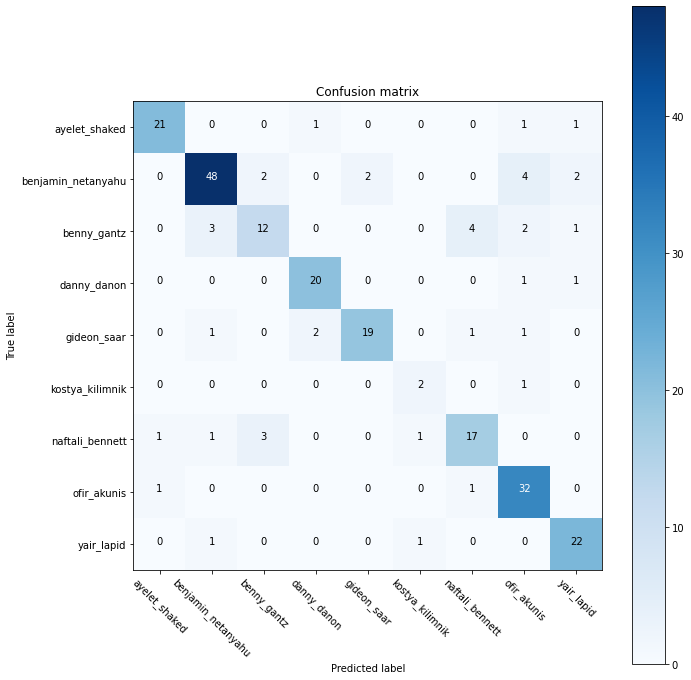

In [41]:
nb_classes = 9

confusion_matrix = torch.zeros(nb_classes, nb_classes)
with torch.no_grad():
    for i, (inputs, classes) in enumerate(dataloaders['val']):
        inputs = inputs.to(device)
        classes = classes.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        for t, p in zip(classes.view(-1), preds.view(-1)):
                confusion_matrix[t.long(), p.long()] += 1

plot_confusion_matrix(cm=confusion_matrix,classes=class_names)

It seems like classes 2 and 6 (benny_gantz and naftali_bennett) images are harder to classify. Reviewing benny_gantz images revealed that in many of them he's photographed together with another person from another class(e.g. benjamin_netanyahu). This is the case also for naftali_bennet.

To improve the model we should clean the data- make all images present only one person. Then we can augment the remaining images to enlarge the dataset.

## Task 3: Perform Error Analysis 
Error Analysis is an extremely important practice in Machine Learning research. It is rare that our base model works great out of the box. Proper error analysis helps us detect and fix issues in our DL code, data preprocessing and even in the data itself.

#### Review examples of top errors
One of the basic techniques of Error Analysis is manually reviewing the top errors of the model - samples where the model was most confident about one class, but the true label was different.  
Plot the top 10 errors of the model for each true class.  
Do you spot any issue or pattern?  
Try to see if you can improve the performance of the model following your insights.

In [42]:
def get_pred_with_probs(model, data_loader):
    model.eval()
    predictions = []
    real_values = []
    probabilities = []
    sm = torch.nn.Softmax()

    with torch.no_grad():
    
        for inputs, labels in data_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = sm(model(inputs))
            probs, preds = torch.max(outputs, 1)
            predictions.extend(preds)
            real_values.extend(labels)
            probabilities.extend(probs)
  
    predictions = torch.as_tensor(predictions).cpu()
    real_values = torch.as_tensor(real_values).cpu()
    probabilities = torch.as_tensor(probabilities).cpu()
    return predictions, real_values, probabilities

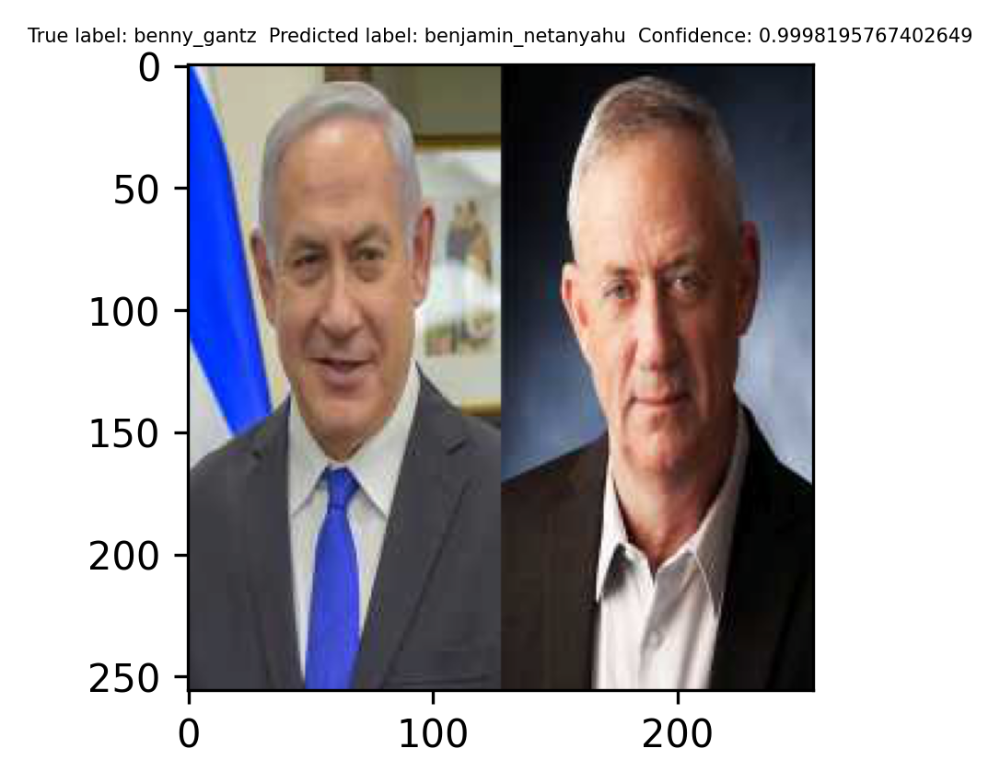

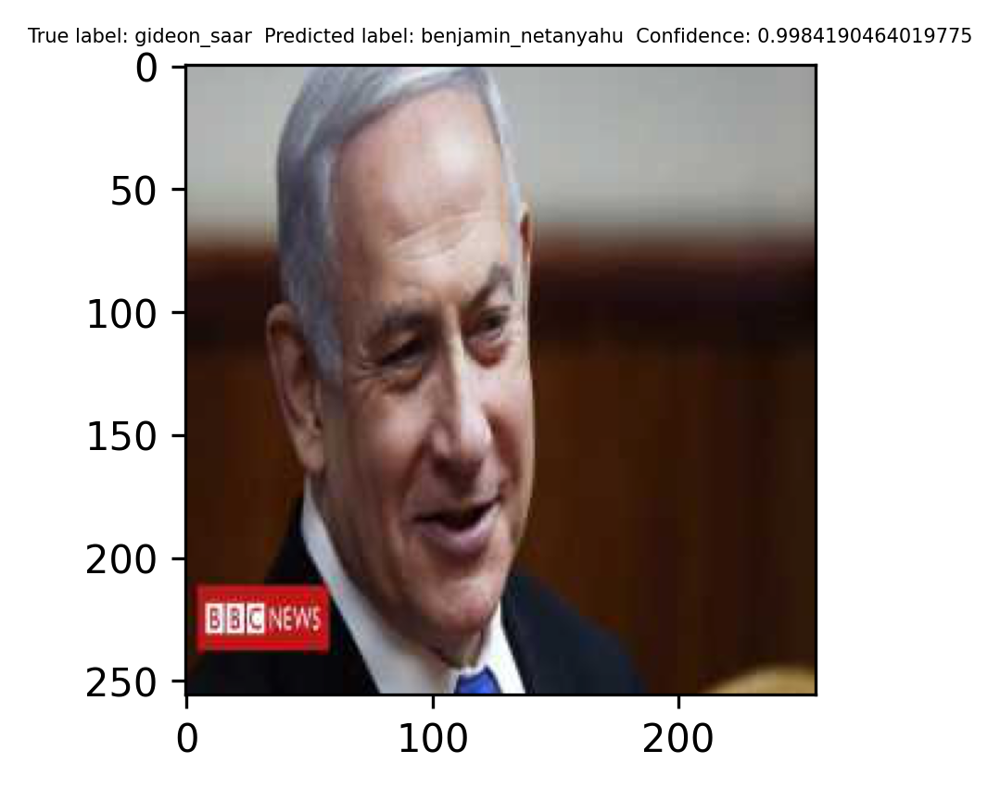

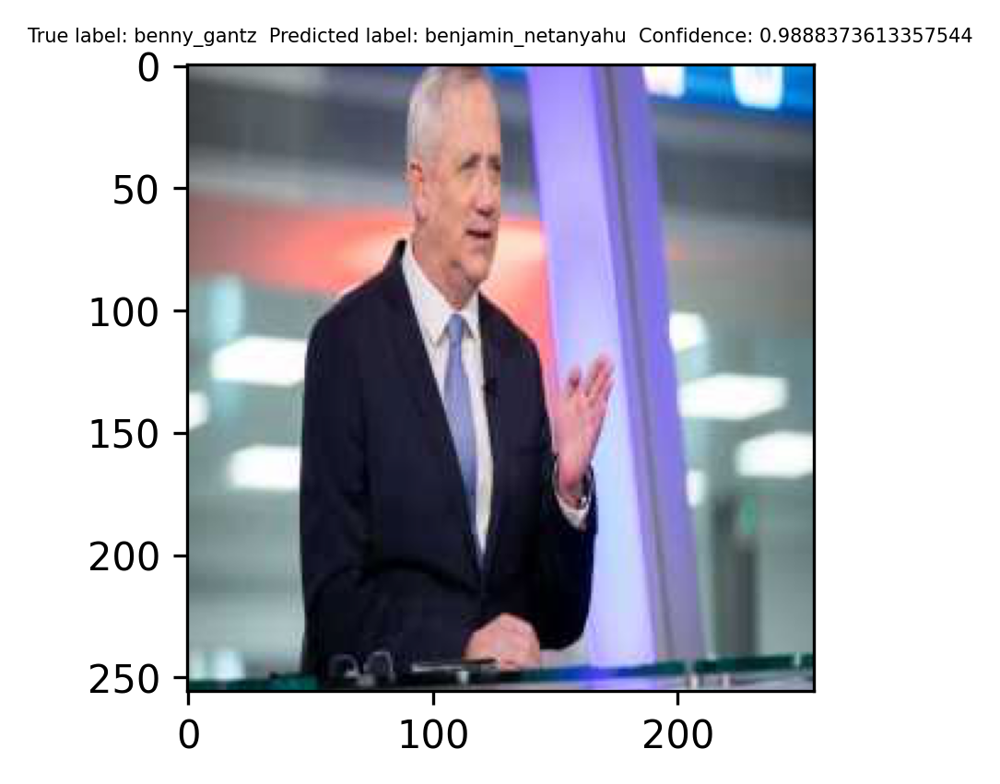

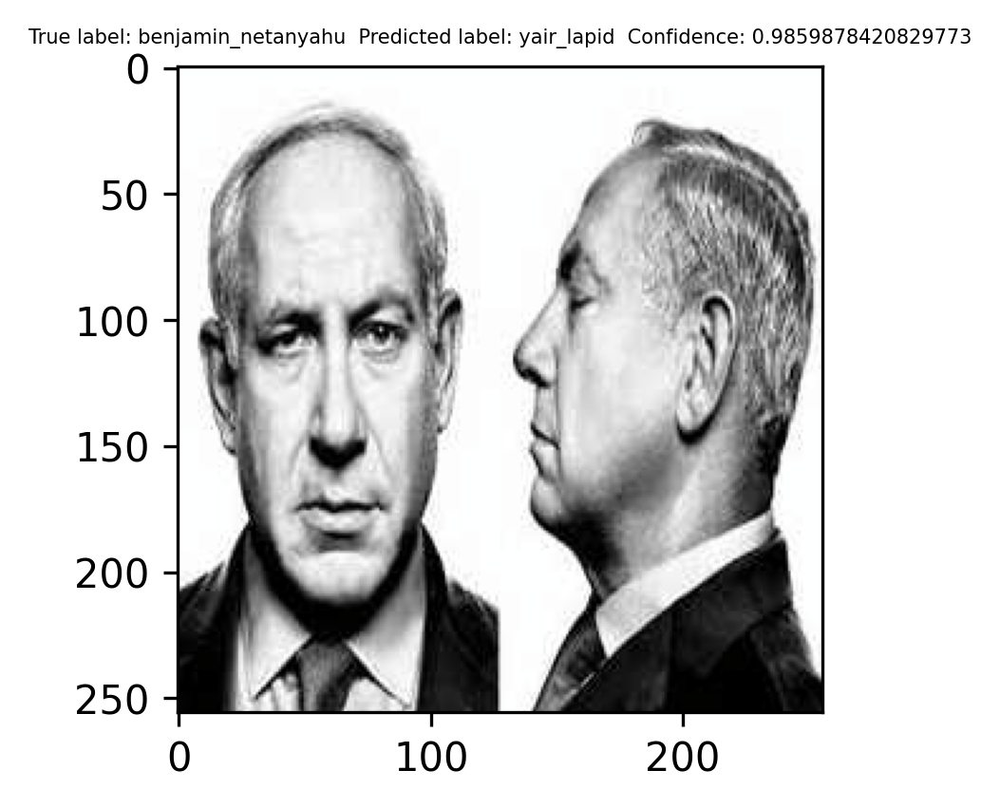

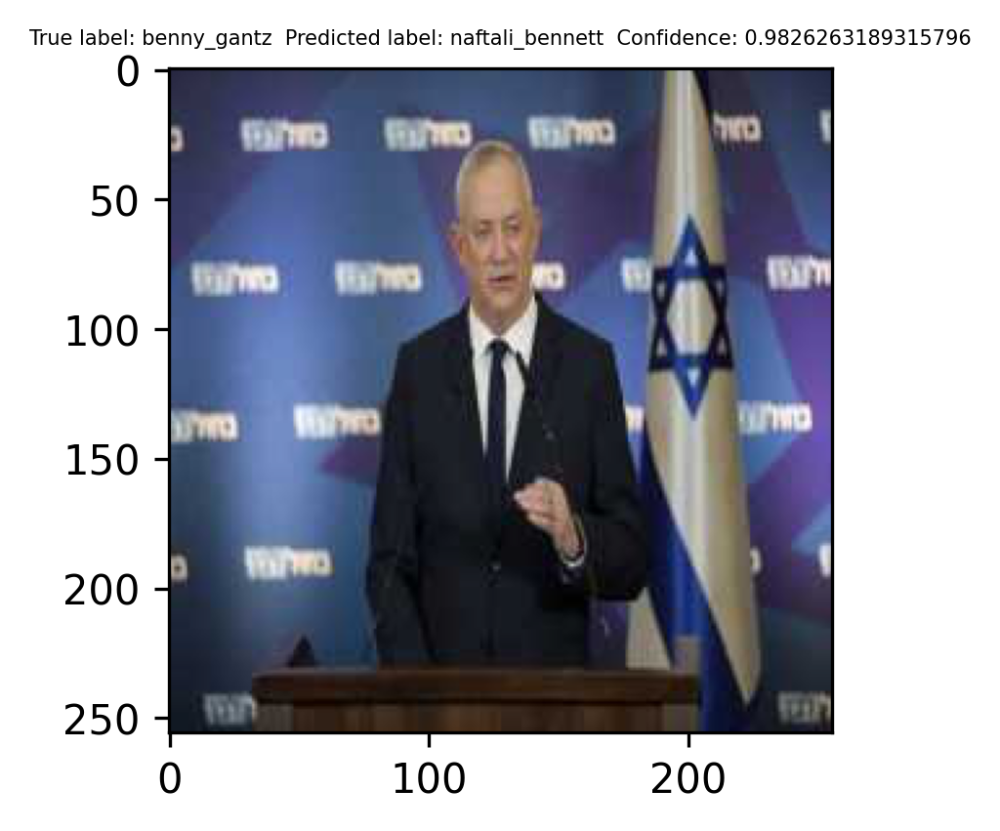

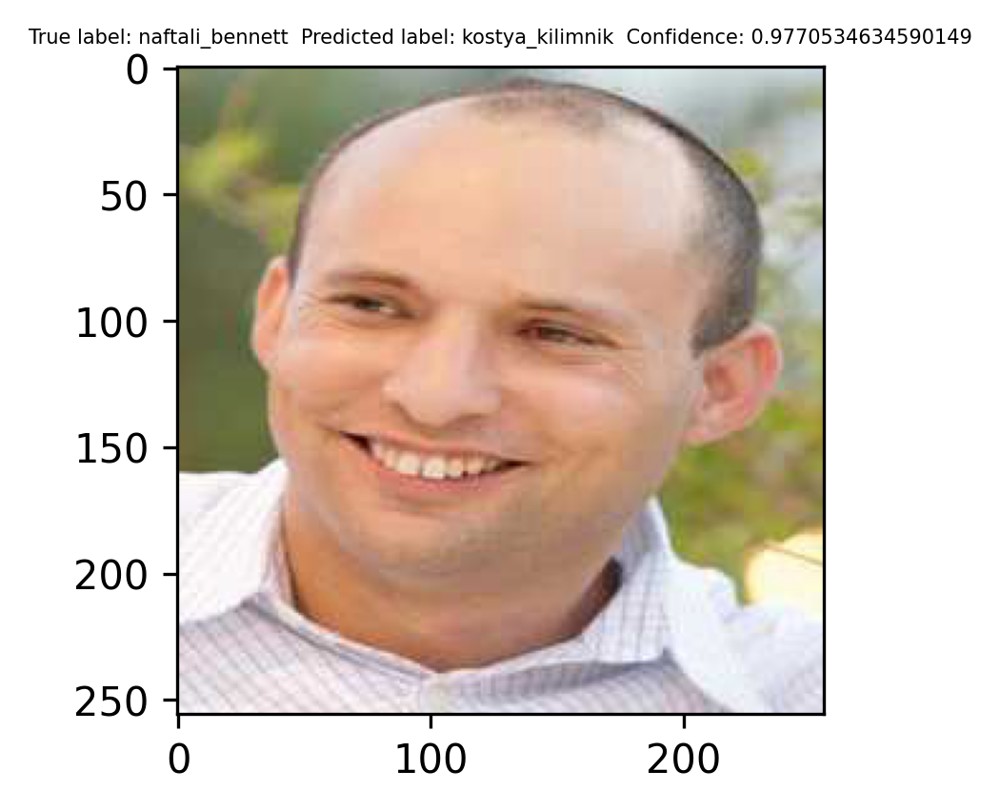

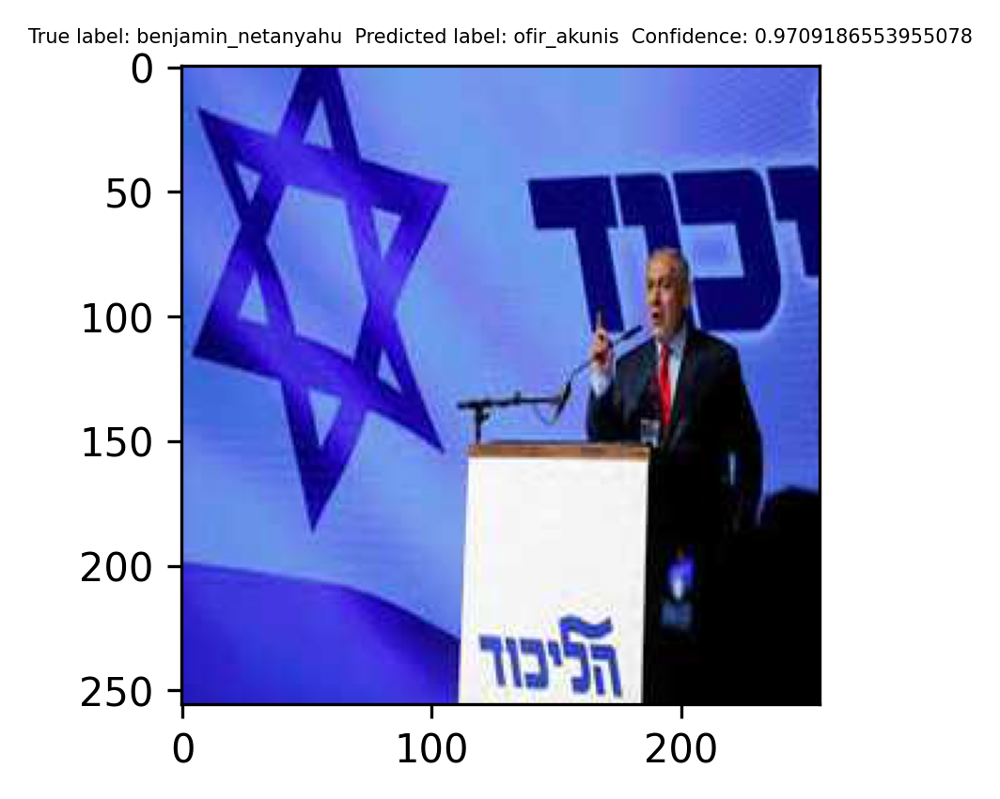

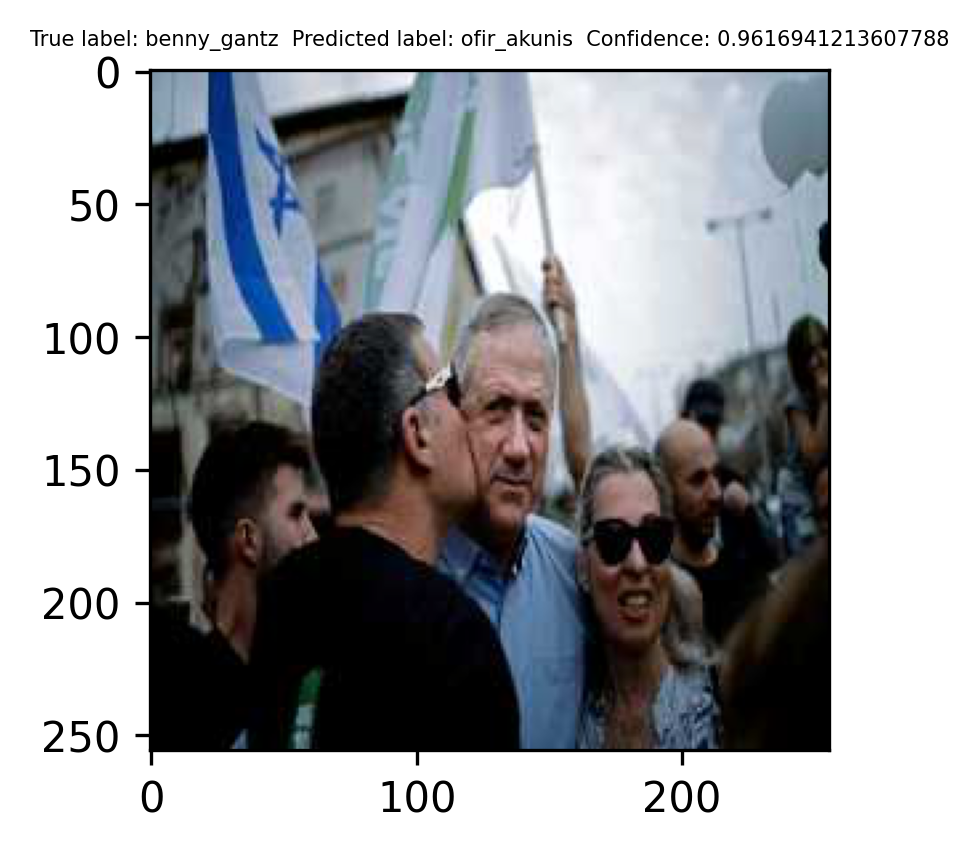

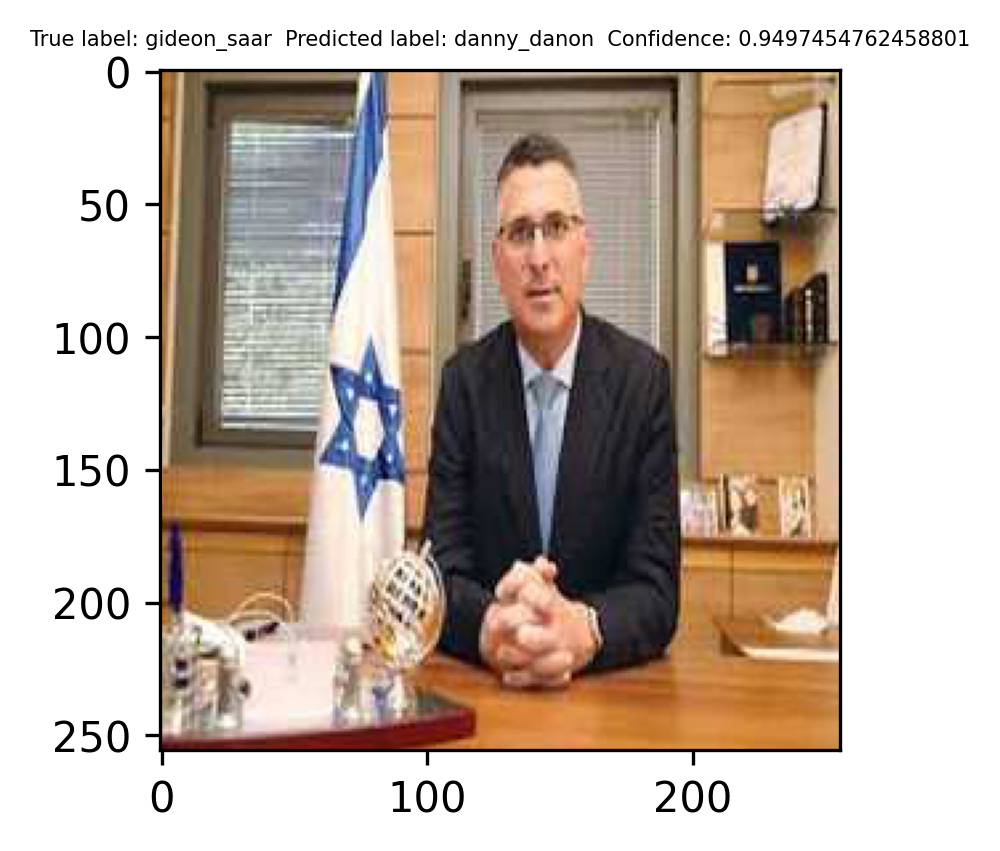

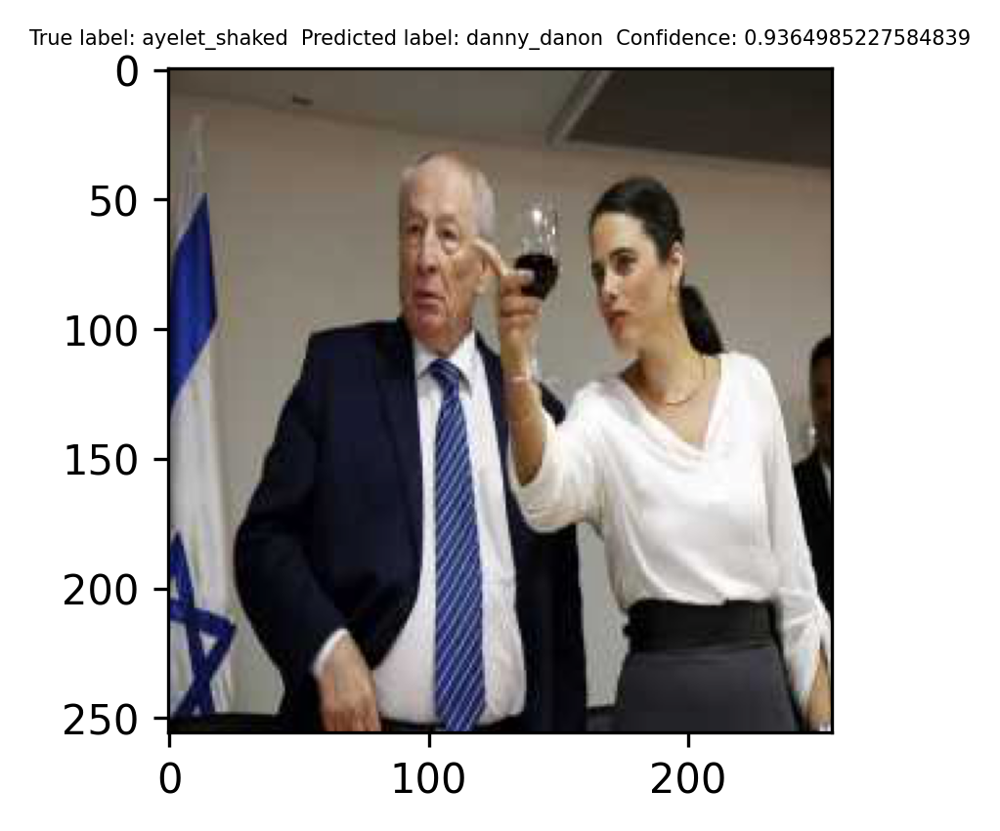

In [43]:
# Showing top 10 most confident errors for all the classes (as explained on Slack)
# Please note that there are some duplicates in the val images folder so sometimes we see identical image twice

import numpy.ma as ma

pred, real, probs = get_pred_with_probs(model, dataloaders['val'])
indices = pred == real
pred = np.array(pred)
real = np.array(real)
probs = np.array(probs)
mask_arr = ma.masked_array(probs, mask =indices)
top = mask_arr.argsort(fill_value=0)[-10:][::-1]

for i in top:
    label = f'True label: {class_names[real[i]]}  Predicted label: {class_names[pred[i]]}  Confidence: {probs[i]}'
    image = dataloaders['val'].dataset[i][0]
    imshow(image,label)

We see issues with the data like wrong labeled images or images with multiple persons that the model can't predict well. Maybe we can use augmentation for helping the model.

## Task 4: NN as a fixed feature extractor

Here, we need to freeze all the network except the final layer. We need
to set ``requires_grad == False`` to freeze the parameters so that the
gradients are not computed in ``backward()``.

You can read more about this in the documentation [here](https://pytorch.org/docs/notes/autograd.html#excluding-subgraphs-from-backward).




In [44]:
model = models.vgg16(pretrained=True)
model = model.to(device)

for param in model.parameters():
    param.requires_grad = False

# Set the last layer again
# (as we needed to do before since the output size is different, this new layer will be grad enabled as we will see in the model summary)
model.classifier[6] = nn.Linear(in_features=4096, out_features=9)

optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
summary(model.to(device), (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
              ReLU-2         [-1, 64, 256, 256]               0
            Conv2d-3         [-1, 64, 256, 256]          36,928
              ReLU-4         [-1, 64, 256, 256]               0
         MaxPool2d-5         [-1, 64, 128, 128]               0
            Conv2d-6        [-1, 128, 128, 128]          73,856
              ReLU-7        [-1, 128, 128, 128]               0
            Conv2d-8        [-1, 128, 128, 128]         147,584
              ReLU-9        [-1, 128, 128, 128]               0
        MaxPool2d-10          [-1, 128, 64, 64]               0
           Conv2d-11          [-1, 256, 64, 64]         295,168
             ReLU-12          [-1, 256, 64, 64]               0
           Conv2d-13          [-1, 256, 64, 64]         590,080
             ReLU-14          [-1, 256,

### Train and evaluate

On CPU this will take about half the time compared to previous scenario. This is expected as gradients don't need to be computed for most of the network. However, forward does need to be computed.

In [45]:
model = train_model(model, 
                    dataloaders,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)

Epoch 0/9
----------
train Loss: 1.8643 Acc: 0.3132
val Loss: 1.6023 Acc: 0.4274

Epoch 1/9
----------
train Loss: 1.5366 Acc: 0.4639
val Loss: 1.5106 Acc: 0.4957

Epoch 2/9
----------
train Loss: 1.3576 Acc: 0.5253
val Loss: 1.5253 Acc: 0.4274

Epoch 3/9
----------
train Loss: 1.3578 Acc: 0.5081
val Loss: 1.3364 Acc: 0.5513

Epoch 4/9
----------
train Loss: 1.2528 Acc: 0.5630
val Loss: 1.3372 Acc: 0.5299

Epoch 5/9
----------
train Loss: 1.1427 Acc: 0.6071
val Loss: 1.3190 Acc: 0.5812

Epoch 6/9
----------
train Loss: 1.1421 Acc: 0.5920
val Loss: 1.3040 Acc: 0.5641

Epoch 7/9
----------
train Loss: 1.0397 Acc: 0.6383
val Loss: 1.2760 Acc: 0.5641

Epoch 8/9
----------
train Loss: 1.0558 Acc: 0.6319
val Loss: 1.2779 Acc: 0.5598

Epoch 9/9
----------
train Loss: 1.0316 Acc: 0.6394
val Loss: 1.2652 Acc: 0.5897

Training complete in 1m 21s
Best val Acc: 0.589744


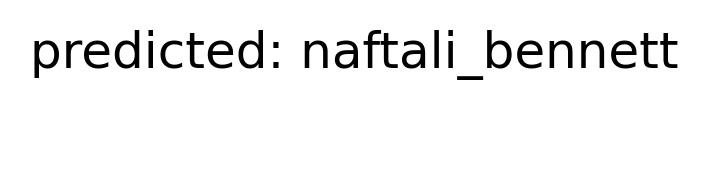

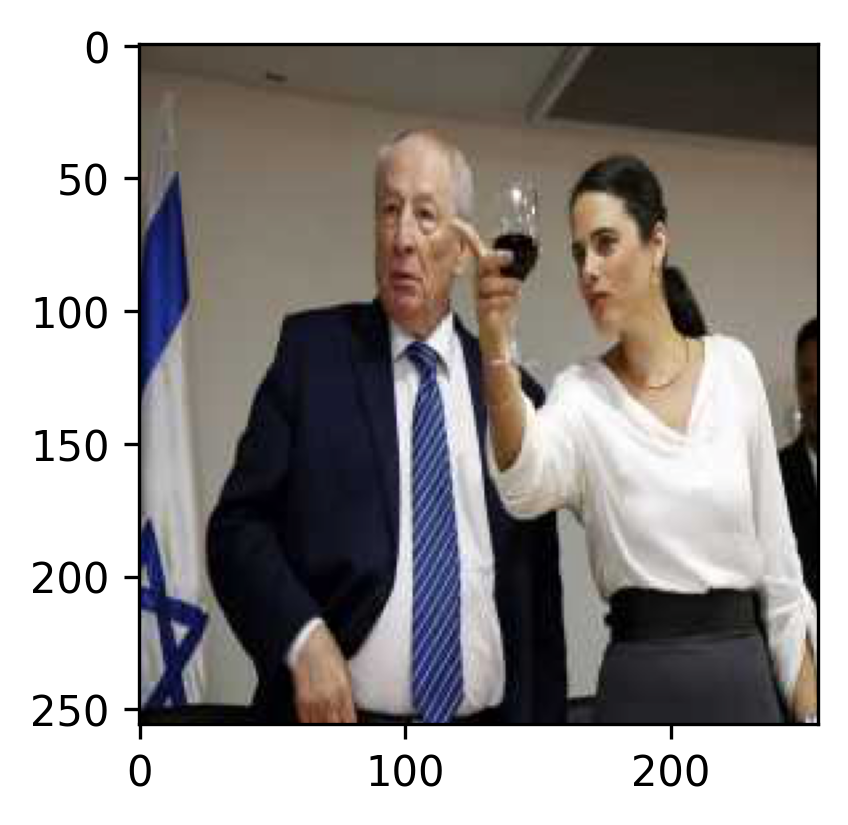

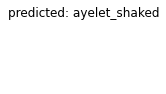

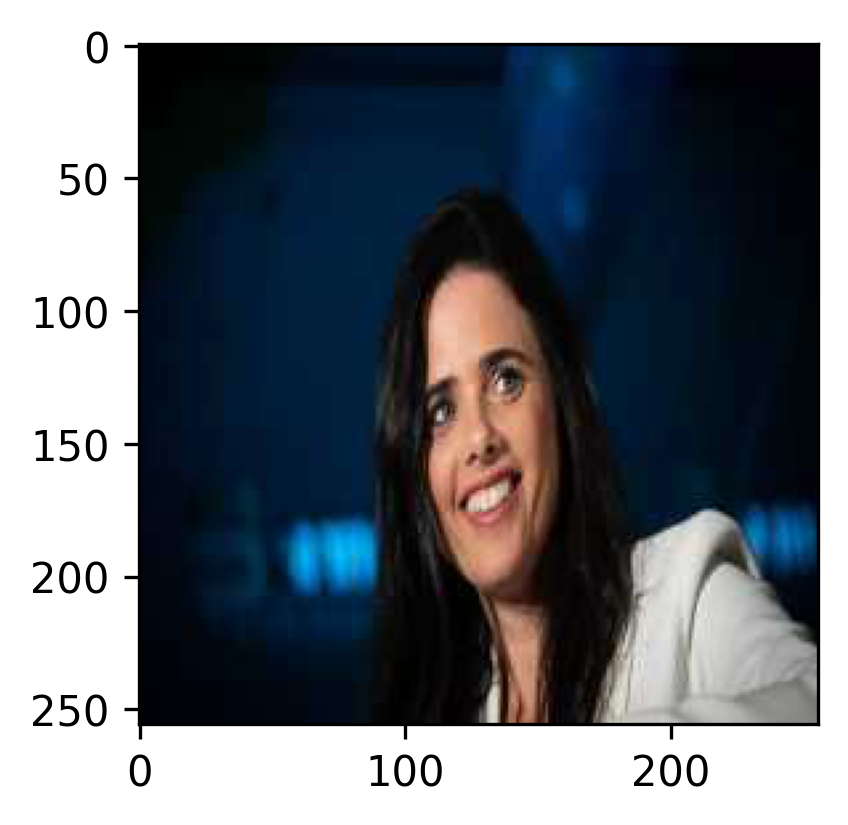

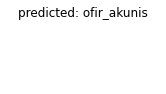

...

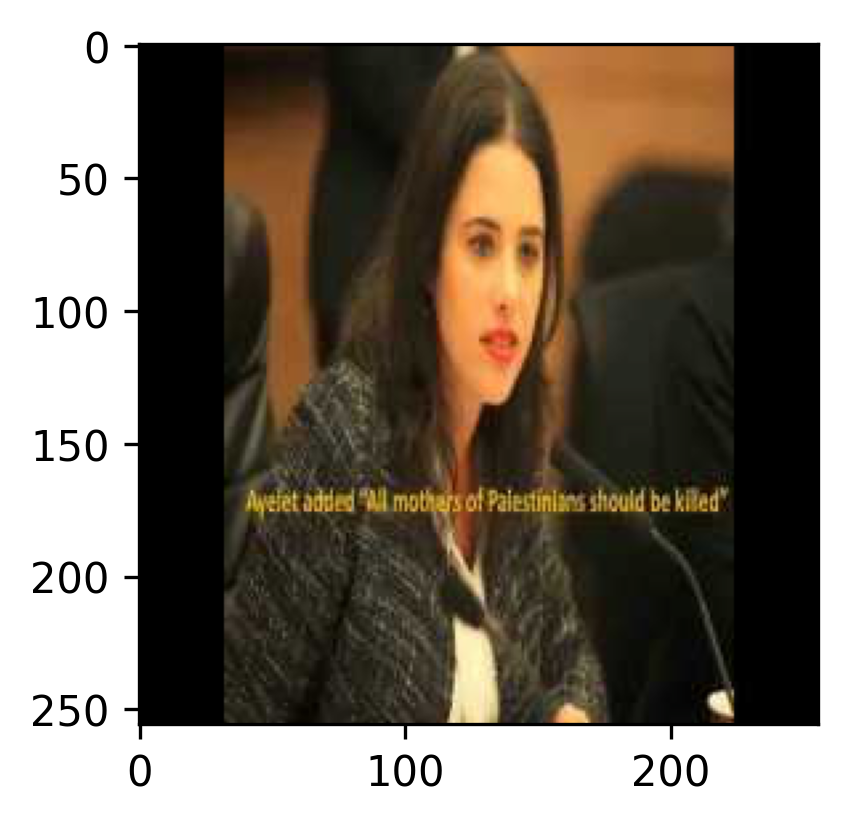

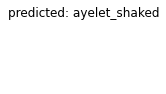

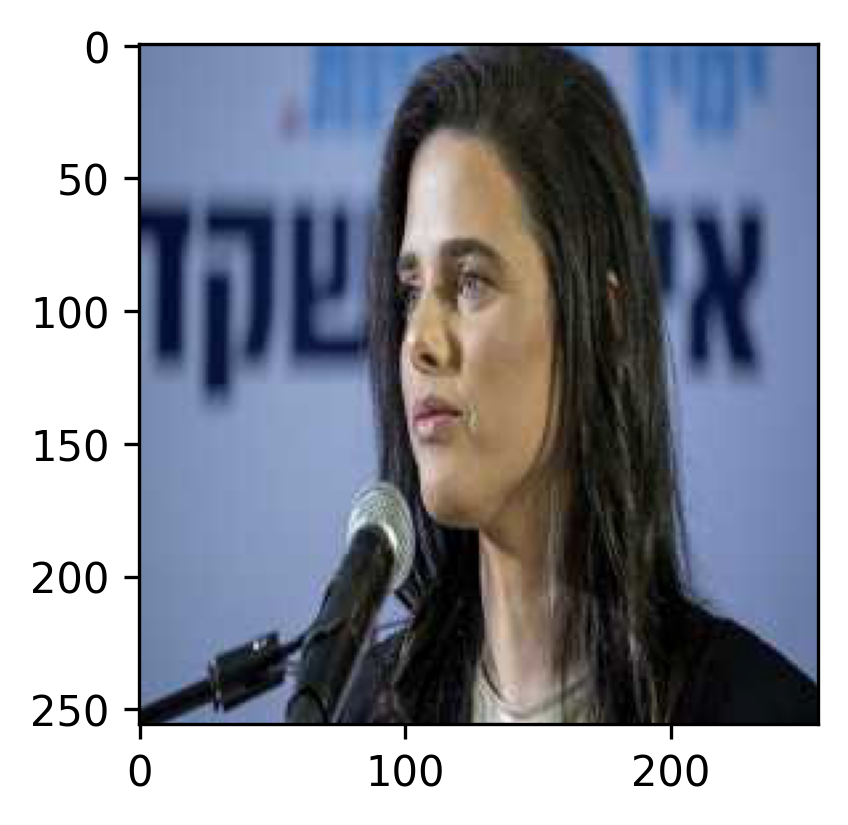

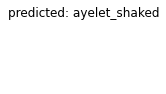

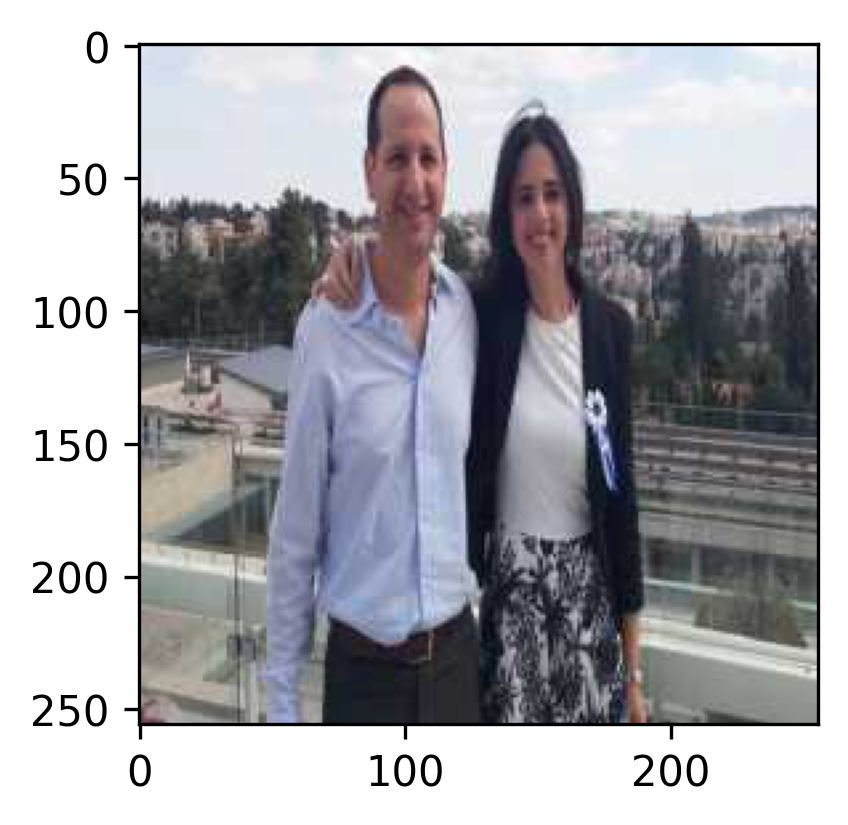

In [46]:
visualize_model(model)

plt.ioff()
plt.show()

Freezing all layers but the last one deteriorated the model performance. Could be because the lower levels hold weights which are finetuned to human faces.

## Task 5: Comparison with a model trained from scratch
In this section, compare the performance of the pretrained model with those of a model trained from scratch.  
Plot the train and validation loss and accuracy with time.

Note: To do this, you will need to modify `train_model()` to return the validation accuracy.

In [47]:
def train_model_accuracy(model, dataloaders, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    # Init variables that will save info about the best model
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    # Lists to save loss and the accuracy for every epoch
    val_acc = []
    val_loss = []

    for epoch in range(num_epochs):

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                # Set model to training mode. 
                model.train()  
            else:
                # Set model to evaluate mode. In evaluate mode, we don't perform backprop and don't need to keep the gradients
                model.eval()   

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data
            for inputs, labels in dataloaders[phase]:
                # Prepare the inputs for GPU/CPU
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # ===== forward pass ======
                with torch.set_grad_enabled(phase=='train'):
                    # If we're in train mode, we'll track the gradients to allow back-propagation
                    outputs = model(inputs) # apply the model to the inputs. The output is the softmax probability of each class
                    _, preds = torch.max(outputs, 1) # 
                    loss = criterion(outputs, labels)

                    # ==== backward pass + optimizer step ====
                    # This runs only in the training phase
                    
                    if phase == 'train':
                        loss.backward() # Perform a step in the opposite direction of the gradient
                        optimizer.step() # Adapt the optimizer

                # Collect statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                
            if phase == 'train':
                # Adjust the learning rate based on the scheduler
                scheduler.step()  

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            # Save epoch loss and accuract
            if phase == 'val':
                val_acc.append(epoch_acc)
                val_loss.append(epoch_loss)
                

            # Keep the results of the best model so far
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                # deepcopy the model
                best_model_wts = copy.deepcopy(model.state_dict())

    time_elapsed = time.time() - since
    print(f'Training complete in {(time_elapsed // 60):.0f}m {(time_elapsed % 60):.0f}s')
    print(f'Best val Acc: {best_acc:4f}')

    # load best model weights
    model.load_state_dict(best_model_wts)
    return val_acc, val_loss


In [48]:
model = models.vgg16(pretrained=True)
model.classifier[6] = nn.Linear(in_features=4096, out_features=9)
model = model.to(device)
optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
pretrained_acc, pretrained_loss = train_model_accuracy(model, 
                    dataloaders,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)

Training complete in 3m 21s
Best val Acc: 0.803419


In [49]:
model = models.vgg16(pretrained=False)
model.classifier[6] = nn.Linear(in_features=4096, out_features=9)
model = model.to(device)
optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
scratch_acc, scratch_loss = train_model_accuracy(model, 
                    dataloaders,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)

Training complete in 3m 21s
Best val Acc: 0.247863


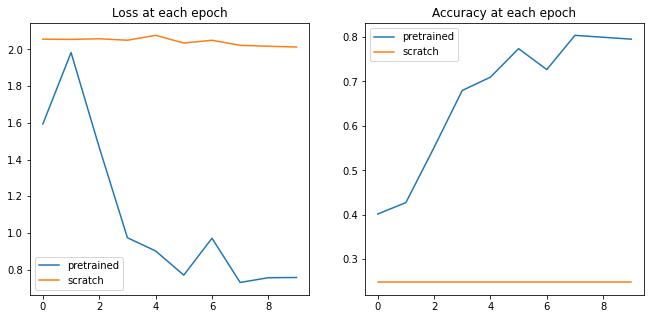

In [50]:
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(11, 5), facecolor='w', edgecolor='k')
ax1.set_title('Loss at each epoch')
ax2.set_title('Accuracy at each epoch')
ax1.plot(range(num_epochs),pretrained_loss,label="pretrained")
ax1.plot(range(num_epochs),scratch_loss,label="scratch")
ax2.plot(range(num_epochs),pretrained_acc,label="pretrained")
ax2.plot(range(num_epochs),scratch_acc,label="scratch")
ax1.legend()
ax2.legend()

Using an untrained model gave bad results, meaning there are common low level features like contour, contrast, etc. that are shared between all types of images and learning them helps the preformance

## Task 6: Data Augmentation
Manually labeling can be expensive, both in terms of money and of time. Data augmentations serve to increase the amount of data available for the classifier without requiring labeling more images.  

The torch vision package allows easy augmentation of images using the data transforms.  
Use and adapt the code below to try different augmentations, and discuss the results and the model improvements you got from these augmentations.

[This guide](https://www.analyticsvidhya.com/blog/2019/12/image-augmentation-deep-learning-pytorch/) might help you along the way.

In [63]:
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomHorizontalFlip(0.4),
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.RandomErasing(),
        transforms.Normalize(means, stds)
    ]),
    'val': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
}

image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
dataloaders = {
    'train': torch.utils.data.DataLoader(image_datasets['train'], batch_size=16,
                                             shuffle=True, num_workers=4),
    'val': torch.utils.data.DataLoader(image_datasets['val'], batch_size=16,
                                          shuffle=False, num_workers=4)
  }

model = models.vgg16(pretrained=True)
model.classifier[6] = nn.Linear(in_features=4096, out_features=9)
model = model.to(device)
optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
model = train_model(model, 
                    dataloaders,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)

Epoch 0/9
----------
train Loss: 1.8348 Acc: 0.3326
val Loss: 1.4932 Acc: 0.4487

Epoch 1/9
----------
train Loss: 1.3855 Acc: 0.5221
val Loss: 1.2763 Acc: 0.5556

Epoch 2/9
----------
train Loss: 0.9857 Acc: 0.6825
val Loss: 0.9995 Acc: 0.6667

Epoch 3/9
----------
train Loss: 0.8239 Acc: 0.7341
val Loss: 0.8126 Acc: 0.7436

Epoch 4/9
----------
train Loss: 0.5435 Acc: 0.8224
val Loss: 0.7836 Acc: 0.7350

Epoch 5/9
----------
train Loss: 0.4531 Acc: 0.8515
val Loss: 0.7843 Acc: 0.7564

Epoch 6/9
----------
train Loss: 0.3677 Acc: 0.8751
val Loss: 0.8807 Acc: 0.7607

Epoch 7/9
----------
train Loss: 0.2318 Acc: 0.9214
val Loss: 0.6619 Acc: 0.8120

Epoch 8/9
----------
train Loss: 0.1705 Acc: 0.9462
val Loss: 0.6681 Acc: 0.8291

Epoch 9/9
----------
train Loss: 0.1703 Acc: 0.9505
val Loss: 0.6784 Acc: 0.8291

Training complete in 3m 23s
Best val Acc: 0.829060


In [64]:
y_pred, y_test = get_predictions(model, dataloaders['val'])
print(classification_report(y_test, y_pred, target_names=class_names))

                    precision    recall  f1-score   support

     ayelet_shaked       0.92      0.96      0.94        24
benjamin_netanyahu       0.85      0.81      0.83        58
       benny_gantz       0.67      0.45      0.54        22
       danny_danon       0.91      0.95      0.93        22
       gideon_saar       0.88      0.88      0.88        24
   kostya_kilimnik       0.60      1.00      0.75         3
   naftali_bennett       0.67      0.78      0.72        23
       ofir_akunis       0.80      0.82      0.81        34
        yair_lapid       0.92      0.96      0.94        24

          accuracy                           0.83       234
         macro avg       0.80      0.85      0.82       234
      weighted avg       0.83      0.83      0.83       234



After trying several tranformations we found that RandomHorizontalFlip and RandomErasing can improve the performance (on average, from val accuracy of 0.82 to 0.84). However, we can see improvement for most runs but not for all.

## Task 7: Model Architectures
In the course we'll cover in depth various DL architectures suggested to perform image classification. Among other things, these networks differ in depth (the number of layers), the number of weights (the network power), the composing layers, and more.  
In the figure below, you can see the performance of different network architectures on the ImageNet Image Classification task, and the number of flops (atomic computations) required for them. 

![CNN performance/flops graph](https://miro.medium.com/max/1838/1*n16lj3lSkz2miMc_5cvkrA.jpeg)

In our code above we've used the `mobilenet` architecture.  
See if you can increase model performance by using alternative architectures from [torchvision.models](https://pytorch.org/vision/0.8/models.html).  
Pay attention to the input dimensions that each network architecture expects.

In [53]:
model = models.resnext50_32x4d(pretrained=True)
model

Downloading: "https://download.pytorch.org/models/resnext50_32x4d-7cdf4587.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-7cdf4587.pth


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
      (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1

In [54]:
model.fc = nn.Linear(in_features=2048, out_features=9)
summary(model.to(device), (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           9,408
       BatchNorm2d-2         [-1, 64, 128, 128]             128
              ReLU-3         [-1, 64, 128, 128]               0
         MaxPool2d-4           [-1, 64, 64, 64]               0
            Conv2d-5          [-1, 128, 64, 64]           8,192
       BatchNorm2d-6          [-1, 128, 64, 64]             256
              ReLU-7          [-1, 128, 64, 64]               0
            Conv2d-8          [-1, 128, 64, 64]           4,608
       BatchNorm2d-9          [-1, 128, 64, 64]             256
             ReLU-10          [-1, 128, 64, 64]               0
           Conv2d-11          [-1, 256, 64, 64]          32,768
      BatchNorm2d-12          [-1, 256, 64, 64]             512
           Conv2d-13          [-1, 256, 64, 64]          16,384
      BatchNorm2d-14          [-1, 256,

In [55]:
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
    'val': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
}

image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
dataloaders = {
    'train': torch.utils.data.DataLoader(image_datasets['train'], batch_size=16,
                                             shuffle=True, num_workers=4),
    'val': torch.utils.data.DataLoader(image_datasets['val'], batch_size=16,
                                          shuffle=False, num_workers=4)
  }

model = model.to(device)
optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
model = train_model(model, 
                    dataloaders,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)

Epoch 0/9
----------
train Loss: 1.8393 Acc: 0.3563
val Loss: 1.3707 Acc: 0.5427

Epoch 1/9
----------
train Loss: 0.9378 Acc: 0.7341
val Loss: 0.7816 Acc: 0.7906

Epoch 2/9
----------
train Loss: 0.3739 Acc: 0.9160
val Loss: 0.5786 Acc: 0.8291

Epoch 3/9
----------
train Loss: 0.1613 Acc: 0.9817
val Loss: 0.4713 Acc: 0.8462

Epoch 4/9
----------
train Loss: 0.0869 Acc: 0.9903
val Loss: 0.4657 Acc: 0.8632

Epoch 5/9
----------
train Loss: 0.0629 Acc: 0.9935
val Loss: 0.4559 Acc: 0.8547

Epoch 6/9
----------
train Loss: 0.0562 Acc: 0.9914
val Loss: 0.4198 Acc: 0.8803

Epoch 7/9
----------
train Loss: 0.0275 Acc: 0.9989
val Loss: 0.4669 Acc: 0.8590

Epoch 8/9
----------
train Loss: 0.0259 Acc: 0.9957
val Loss: 0.4401 Acc: 0.8547

Epoch 9/9
----------
train Loss: 0.0297 Acc: 0.9968
val Loss: 0.4395 Acc: 0.8675

Training complete in 3m 14s
Best val Acc: 0.880342


In [56]:
y_pred, y_test = get_predictions(model, dataloaders['val'])
print(classification_report(y_test, y_pred, target_names=class_names))

                    precision    recall  f1-score   support

     ayelet_shaked       0.92      0.96      0.94        24
benjamin_netanyahu       0.96      0.90      0.93        58
       benny_gantz       0.94      0.68      0.79        22
       danny_danon       0.78      0.82      0.80        22
       gideon_saar       0.91      0.83      0.87        24
   kostya_kilimnik       1.00      1.00      1.00         3
   naftali_bennett       0.81      0.91      0.86        23
       ofir_akunis       0.78      0.91      0.84        34
        yair_lapid       0.92      0.96      0.94        24

          accuracy                           0.88       234
         macro avg       0.89      0.89      0.88       234
      weighted avg       0.89      0.88      0.88       234



**resnext50_32x4d** architecture improves model performance from Best val Acc of 0.82 in average for vgg16 to 0.87 in average.

## Task 8: Design your own Neural Network Architecture
Take a stab at building your own NN architecture.  
To allow you to experiment quickly, we'll limit it to 8 layers max, and up to 10 million parameters. Use [this PyTorch guide](https://pytorch.org/tutorials/beginner/blitz/neural_networks_tutorial.html) for reference.  
Train it only on our provided images - we'll present the winner with the best results on the validation set!

In [57]:
import torch.nn.functional as F

class Net(nn.Module):

    def __init__(self):
        super(Net, self).__init__()
        # 3 input image channel, 128 output channels, 3x3 square convolution
        # kernel
        self.conv1 = nn.Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.conv2 = nn.Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.conv3 = nn.Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.conv4 = nn.Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.conv5 = nn.Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        
        # an affine operation: y = Wx + b
        self.fc1 = nn.Linear(in_features=128*8*8, out_features=1024, bias=True)
        self.fc2 = nn.Linear(in_features=1024, out_features=1024, bias=True)
        self.fc3 = nn.Linear(in_features=1024, out_features=9, bias=True)

    def forward(self, x):
        # Max pooling over a (2, 2) window
        x = F.max_pool2d(F.relu(self.conv1(x)), kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        x = F.max_pool2d(F.relu(self.conv2(x)), kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        x = F.max_pool2d(F.relu(self.conv3(x)), kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        x = F.max_pool2d(F.relu(self.conv4(x)), kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        x = (F.max_pool2d(F.relu(self.conv5(x)), kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False))
        x = x.view(-1, self.num_flat_features(x))
        x=F.relu(self.fc1(x))
        x=F.relu(self.fc2(x))
        x = self.fc3(x)
        
        return x

    def num_flat_features(self, x):
        size = x.size()[1:]  # all dimensions except the batch dimension
        num_features = 1
        for s in size:
            num_features *= s
        return num_features

net = Net()
print(net)

Net(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (fc1): Linear(in_features=8192, out_features=1024, bias=True)
  (fc2): Linear(in_features=1024, out_features=1024, bias=True)
  (fc3): Linear(in_features=1024, out_features=9, bias=True)
)


In [58]:
summary(net.to(device), (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
            Conv2d-2         [-1, 64, 128, 128]          36,928
            Conv2d-3          [-1, 128, 64, 64]          73,856
            Conv2d-4          [-1, 128, 32, 32]         147,584
            Conv2d-5          [-1, 128, 16, 16]         147,584
            Linear-6                 [-1, 1024]       8,389,632
            Linear-7                 [-1, 1024]       1,049,600
            Linear-8                    [-1, 9]           9,225
Total params: 9,856,201
Trainable params: 9,856,201
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.75
Forward/backward pass size (MB): 45.27
Params size (MB): 37.60
Estimated Total Size (MB): 83.61
----------------------------------------------------------------


In [61]:
# we receive different results for different batch sizes and num_epoch
# with these parameters we certainly have overfit but the val accurcy is increasing as well over the epochs and reaches to relatively high accuracy
# Ideally we would use another set of validation photos that were not part of the process of choosing the best model and evaluate using this set.

dataloaders = {
    'train': torch.utils.data.DataLoader(image_datasets['train'], batch_size=2,
                                             shuffle=True, num_workers=4),
    'val': torch.utils.data.DataLoader(image_datasets['val'], batch_size=2,
                                          shuffle=False, num_workers=4)
  }

net = Net()
net = net.to(device)
optimizer_ft = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
net = train_model(net, 
                    dataloaders,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=20)

Epoch 0/19
----------
train Loss: 2.1116 Acc: 0.2530
val Loss: 2.0639 Acc: 0.2479

Epoch 1/19
----------
train Loss: 2.0494 Acc: 0.2465
val Loss: 2.0247 Acc: 0.2650

Epoch 2/19
----------
train Loss: 1.9744 Acc: 0.2917
val Loss: 2.0046 Acc: 0.2735

Epoch 3/19
----------
train Loss: 1.9430 Acc: 0.3014
val Loss: 1.9456 Acc: 0.3162

Epoch 4/19
----------
train Loss: 1.8704 Acc: 0.3423
val Loss: 1.9602 Acc: 0.2991

Epoch 5/19
----------
train Loss: 1.8249 Acc: 0.3498
val Loss: 1.9318 Acc: 0.2735

Epoch 6/19
----------
train Loss: 1.7292 Acc: 0.3832
val Loss: 1.8671 Acc: 0.2735

Epoch 7/19
----------
train Loss: 1.4549 Acc: 0.4736
val Loss: 1.8440 Acc: 0.3120

Epoch 8/19
----------
train Loss: 1.3305 Acc: 0.5328
val Loss: 1.8374 Acc: 0.3291

Epoch 9/19
----------
train Loss: 1.2105 Acc: 0.5791
val Loss: 1.9225 Acc: 0.3632

Epoch 10/19
----------
train Loss: 1.0655 Acc: 0.6383
val Loss: 1.9038 Acc: 0.4017

Epoch 11/19
----------
train Loss: 0.8809 Acc: 0.6911
val Loss: 1.8026 Acc: 0.4359

Ep

In [62]:
y_pred, y_test = get_predictions(net, dataloaders['val'])
print(classification_report(y_test, y_pred, target_names=class_names))

                    precision    recall  f1-score   support

     ayelet_shaked       0.55      0.46      0.50        24
benjamin_netanyahu       0.65      0.69      0.67        58
       benny_gantz       0.40      0.36      0.38        22
       danny_danon       0.46      0.59      0.52        22
       gideon_saar       0.44      0.33      0.38        24
   kostya_kilimnik       0.00      0.00      0.00         3
   naftali_bennett       0.32      0.39      0.35        23
       ofir_akunis       0.63      0.56      0.59        34
        yair_lapid       0.44      0.50      0.47        24

          accuracy                           0.51       234
         macro avg       0.43      0.43      0.43       234
      weighted avg       0.51      0.51      0.51       234

